In [30]:
# Implementation of WGAN-GP (https://arxiv.org/abs/1704.00028) for pokemon generating
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
from torch.utils.data import DataLoader
from torchvision.utils import save_image
from torchvision.utils import make_grid
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

In [9]:
# Hyperparameters
device = 'cuda' if torch.cuda.is_available() else 'cpu'
LEARNING_RATE = 1e-4
BATCH_SIZE = 64
IMAGE_SIZE = 64
CHANNELS_IMG = 3
Z_DIM = 100
NUM_EPOCHS = 100
CRITIC_CHANNELS = 64
GEN_CHANNELS = 64
CRITIC_ITERATIONS = 5
LAMBDA_GP = 10
DATA_DIR = '/kaggle/input/pokemon-image-dataset'
STATS = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [10]:
class Critic(nn.Module):
    def __init__(self, channels_img=3, critic_channels=64):
        super().__init__()
        self.critic = nn.Sequential(
            # input images: BATCH_SIZE x channels_img x 64 x 64
            nn.Conv2d(channels_img, critic_channels, 4, 2, 1),
            # out: BATCH_SIZE x (critic_channels * 1) x 32 x 32
            nn.LeakyReLU(0.2),
            self._critic_block(critic_channels, critic_channels * 2, 4, 2, 1),
            # out: BATCH_SIZE x (critic_channels * 2) x 16 x 16,
            self._critic_block(critic_channels * 2, critic_channels * 4, 4, 2, 1),
            # out: BATCH_SIZE x (critic_channels * 4) x 8 x 8,
            self._critic_block(critic_channels * 4, critic_channels * 8, 4, 2, 1),
            # out: BATCH_SIZE x (critic_channels * 8) x 4 x 4,
            nn.Conv2d(critic_channels * 8, 1, 4, 2, 0)
            # out: BATCH_SIZE x 1 x 1 x 1
            # tanh or sigmoid are not used, because we're using MSE loss instead of BCE
        )
    
    def _critic_block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
                            nn.InstanceNorm2d(out_channels, affine=True),
                            nn.LeakyReLU(0.2))
    
    def forward(self, x):
        return self.critic(x)

In [11]:
class Generator(nn.Module):
    def __init__(self, z_dim=100, channels_img=3, gen_channels=64):
        super().__init__()
        self.gen = nn.Sequential(
            # input noise: BATCH_SIZE x z_dim x 1 x 1
            self._gen_block(z_dim, gen_channels * 16, 4, 1, 0),
            # out: BATCH_SIZE x (gen_channels * 16) x 4 x 4
            self._gen_block(gen_channels * 16, gen_channels * 8, 4, 2, 1),
            # out: BATCH_SIZE x (gen_channels * 8) x 8 x 8
            self._gen_block(gen_channels * 8, gen_channels * 4, 4, 2, 1),
            # out: BATCH_SIZE x (gen_channels * 4) x 16 x 16
            self._gen_block(gen_channels * 4, gen_channels * 2, 4, 2, 1),
            # out: BATCH_SIZE x (gen_channels * 2) x 32 x 32
            nn.ConvTranspose2d(gen_channels * 2, channels_img, 4, 2, 1),
            # out: BATCH_SIZE x channels_img x 64 x 64,
            nn.Tanh()
            # normalization from -1 to 1
        )
    
    def _gen_block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
                            nn.BatchNorm2d(out_channels),
                            nn.ReLU(0.2))
    
    def forward(self, x):
        return self.gen(x)

In [12]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.InstanceNorm2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)

In [13]:
def gradient_penalty(critic, real_imgs, fake_imgs, device='cpu'):
    batch_size, channels, height, width = real_imgs.shape
    eps = torch.rand((batch_size, 1, 1, 1)).repeat(1, channels, height, width).to(device)
    # creating new mixed images in the form: x*eps + (1-eps)*x', where x, x' are real and fake images
    mixed_imgs = real_imgs * eps + (1 - eps) * fake_imgs
    
    # Critic output to mixed_images
    critic_mix_out = critic(mixed_imgs)
    # Calculating gradient penalty with respect to the mixed_images
    gradient = torch.autograd.grad(inputs=mixed_imgs,
                                   outputs=critic_mix_out,
                                   grad_outputs=torch.ones_like(critic_mix_out),
                                   create_graph=True,
                                   retain_graph=True)[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

In [14]:
def data_getter(dataset_path: str):
    transform = tt.Compose([
        tt.Pad(padding=300, padding_mode='constant', fill=(255, 255, 255)),
        tt.CenterCrop(size=(400, 400)),
        tt.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
        tt.RandomAdjustSharpness(sharpness_factor=2.5, p=0.8),
        tt.ToTensor(),
        tt.Normalize(*STATS)
    ])
    
    transform_persp = tt.Compose([
        tt.Pad(padding=300, padding_mode='constant', fill=(255, 255, 255)),
        tt.CenterCrop(size=(400, 400)),
        tt.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
        tt.RandomPerspective(p=1, fill=(255, 255, 255)),
        tt.RandomAdjustSharpness(sharpness_factor=2.5, p=0.8),
        tt.ToTensor(),
        tt.Normalize(*STATS)
    ])

    transform_rotR = tt.Compose([
        tt.Pad(padding=300, padding_mode='constant', fill=(255, 255, 255)),
        tt.CenterCrop(size=(400, 400)),
        tt.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
        tt.RandomRotation(degrees=(30, 45), fill=(255, 255, 255)),
        tt.RandomAdjustSharpness(sharpness_factor=2.5, p=0.8),
        tt.ToTensor(),
        tt.Normalize(*STATS)
    ])

    transform_rotL = tt.Compose([
        tt.Pad(padding=300, padding_mode='constant', fill=(255, 255, 255)),
        tt.CenterCrop(size=(400, 400)),
        tt.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
        tt.RandomRotation(degrees=(-45, -30), fill=(255, 255, 255)),
        tt.RandomAdjustSharpness(sharpness_factor=2.5, p=0.8),
        tt.ToTensor(),
        tt.Normalize(*STATS)
    ])


    transform_HorizontalFlip = tt.Compose([
        tt.Pad(padding=300, padding_mode='constant', fill=(255, 255, 255)),
        tt.CenterCrop(size=(400, 400)),
        tt.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
        tt.RandomHorizontalFlip(p=1),
        tt.RandomAdjustSharpness(sharpness_factor=2.5, p=0.8),
        tt.ToTensor(),
        tt.Normalize(*STATS)
    ])

    dataset_normal = ImageFolder(root=dataset_path, transform=transform)
    dataset_persp = ImageFolder(root=dataset_path, transform=transform_persp)
    dataset_rotR = ImageFolder(root=dataset_path, transform=transform_rotR)
    dataset_rotL = ImageFolder(root=dataset_path, transform=transform_rotL)
    dataset_HorizontalFlip = ImageFolder(root=dataset_path, transform=transform_HorizontalFlip)
    return torch.utils.data.ConcatDataset([dataset_normal, dataset_persp, dataset_rotR, dataset_rotL, dataset_HorizontalFlip])

In [15]:
def denorm(img_tensors):
    return img_tensors * STATS[1][0] + STATS[0][0]

In [9]:
dataset = data_getter(DATA_DIR)
dloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

In [16]:
generator = Generator(Z_DIM, CHANNELS_IMG, GEN_CHANNELS).to(device)
critic = Critic(CHANNELS_IMG, CRITIC_CHANNELS).to(device)
initialize_weights(generator)
initialize_weights(critic)

In [17]:
opt_generator = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
opt_critic = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

In [18]:
fixed_z = torch.randn(32, Z_DIM, 1, 1).to(device)

In [13]:
generator.train()
critic.train()

Critic(
  (critic): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (5): Conv2d(512, 1, kernel_size=(4, 4), stride=(2, 2))
  )
)

In [14]:
losses_critic = []
losses_generator = []

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [1/100], loss_crit: -63.9299, loss_gen: 30.8079


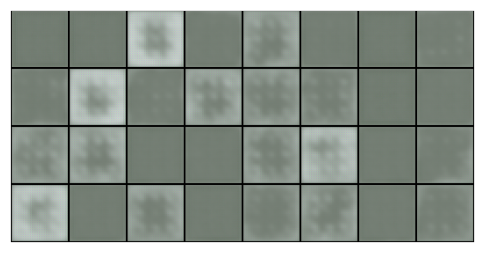

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [2/100], loss_crit: -147.8902, loss_gen: 68.2160


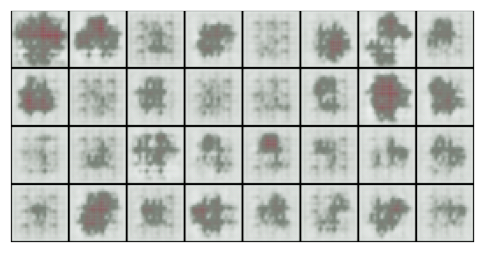

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [3/100], loss_crit: -66.6243, loss_gen: 24.2029


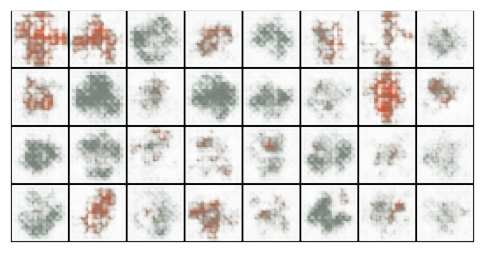

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [4/100], loss_crit: -50.9665, loss_gen: 32.4104


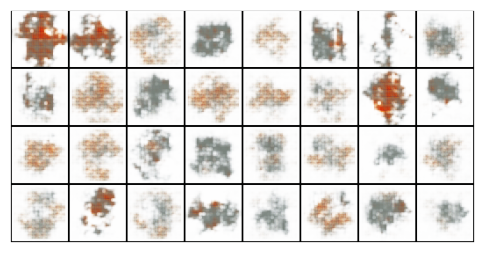

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [5/100], loss_crit: -45.2440, loss_gen: 36.6128


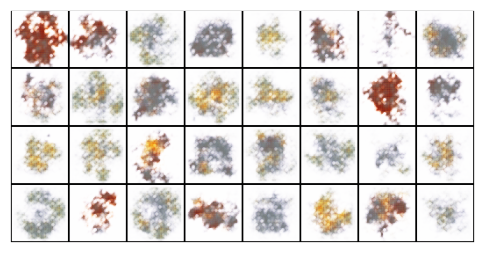

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [6/100], loss_crit: -38.6042, loss_gen: 37.8305


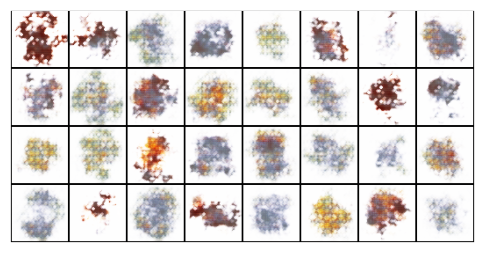

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [7/100], loss_crit: -32.5230, loss_gen: 38.7248


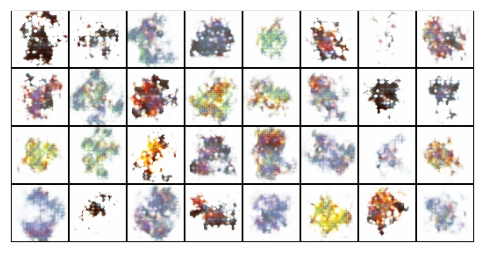

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [8/100], loss_crit: -26.0973, loss_gen: 36.1980


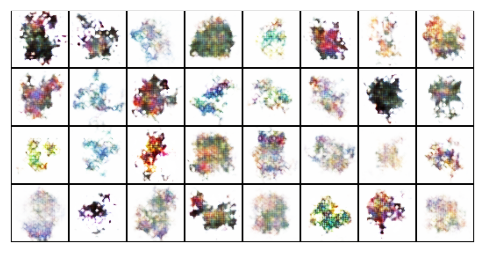

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [9/100], loss_crit: -21.4232, loss_gen: 34.4422


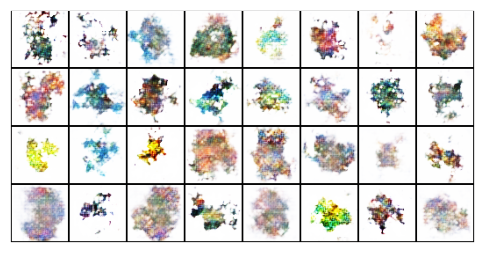

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [10/100], loss_crit: -18.5880, loss_gen: 32.8896


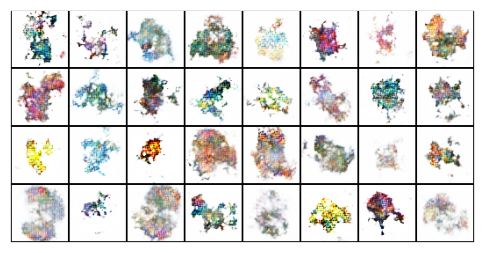

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [11/100], loss_crit: -17.2191, loss_gen: 33.6406


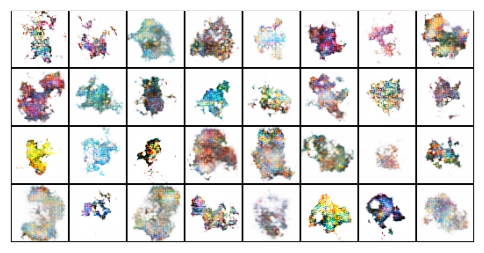

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [12/100], loss_crit: -15.9453, loss_gen: 31.7668


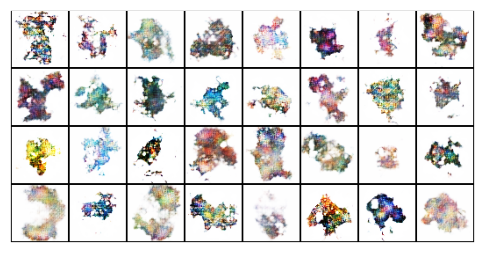

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [13/100], loss_crit: -14.9283, loss_gen: 30.6201


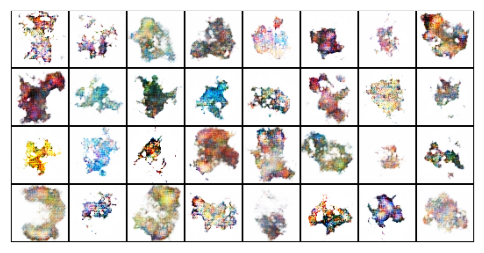

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [14/100], loss_crit: -13.8282, loss_gen: 29.4155


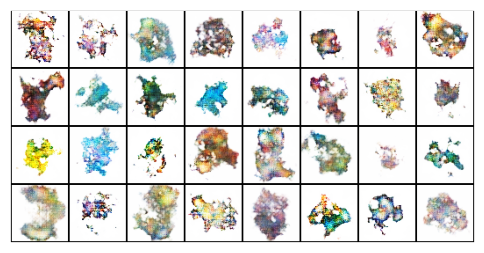

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [15/100], loss_crit: -13.7050, loss_gen: 27.9616


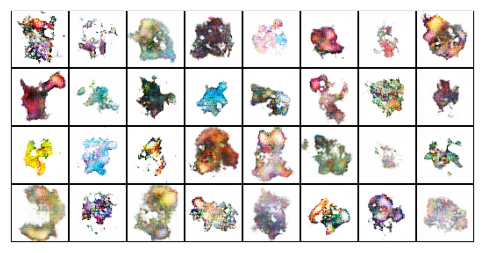

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [16/100], loss_crit: -13.0174, loss_gen: 26.8258


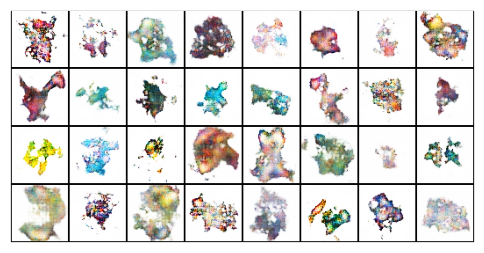

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [17/100], loss_crit: -12.6169, loss_gen: 26.5478


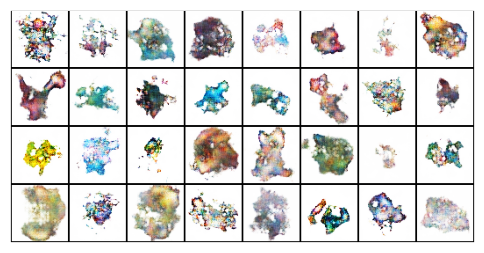

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [18/100], loss_crit: -12.2770, loss_gen: 25.6460


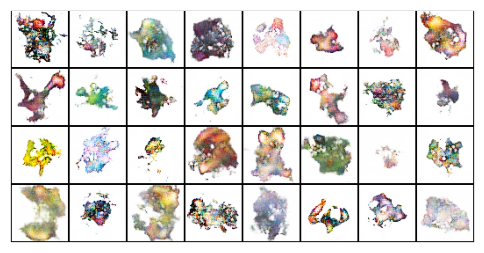

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [19/100], loss_crit: -12.0585, loss_gen: 23.2104


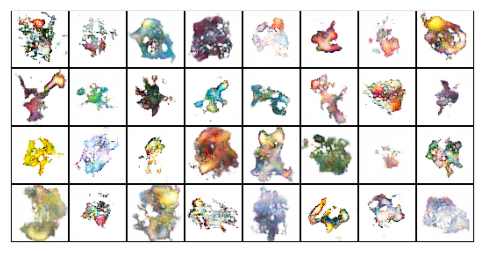

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [20/100], loss_crit: -12.0888, loss_gen: 21.3042


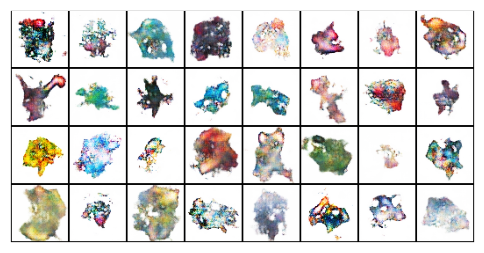

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [21/100], loss_crit: -12.0621, loss_gen: 20.5022


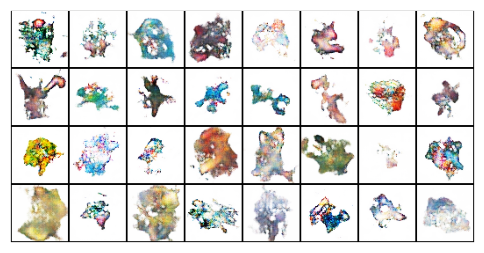

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [22/100], loss_crit: -12.0442, loss_gen: 19.5442


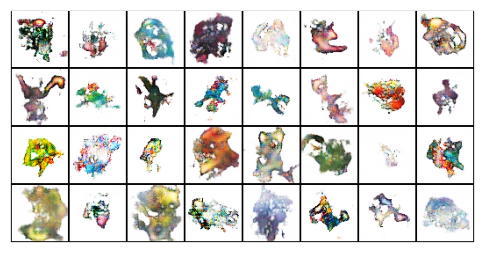

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [23/100], loss_crit: -11.9539, loss_gen: 18.4521


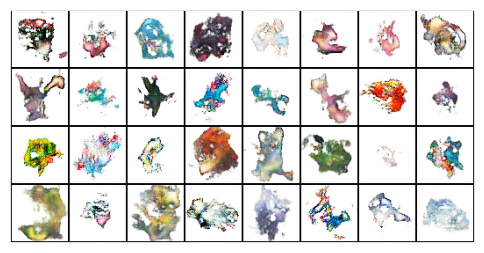

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [24/100], loss_crit: -11.9242, loss_gen: 17.7312


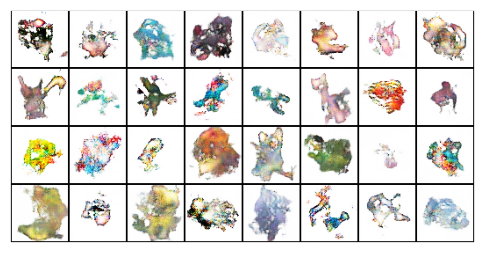

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [25/100], loss_crit: -11.9606, loss_gen: 18.3057


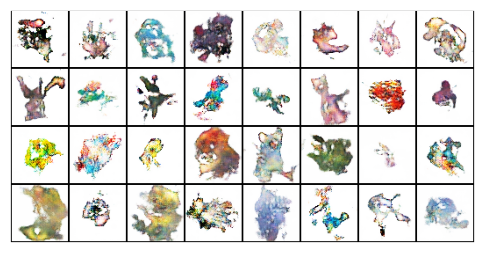

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [26/100], loss_crit: -11.9656, loss_gen: 17.9545


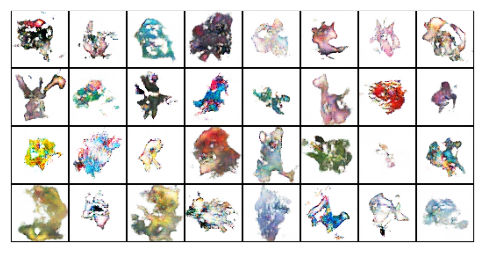

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [27/100], loss_crit: -11.8821, loss_gen: 17.8237


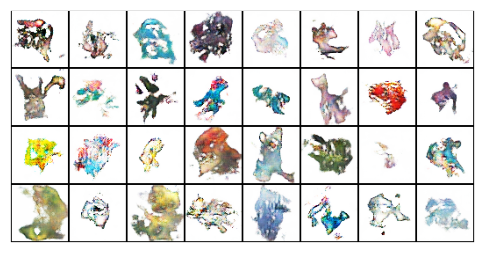

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [28/100], loss_crit: -12.0450, loss_gen: 17.3627


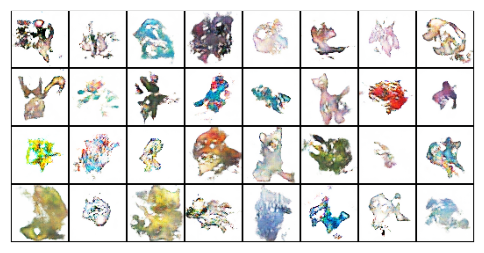

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [29/100], loss_crit: -12.0666, loss_gen: 17.0845


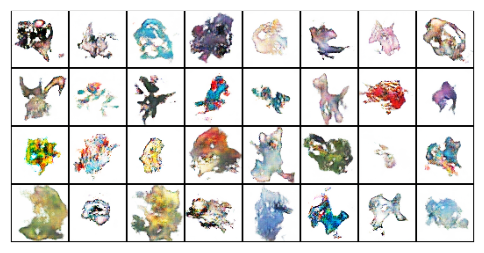

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [30/100], loss_crit: -12.2231, loss_gen: 16.8409


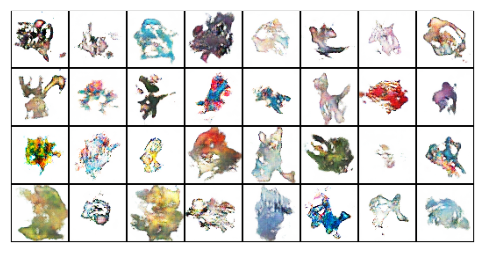

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [31/100], loss_crit: -11.9596, loss_gen: 17.1339


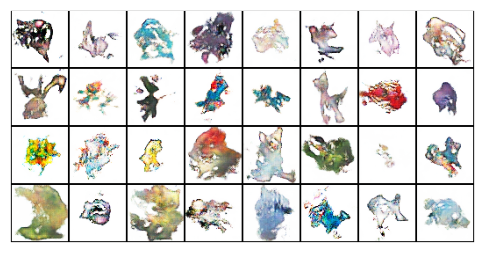

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [32/100], loss_crit: -12.1008, loss_gen: 17.4727


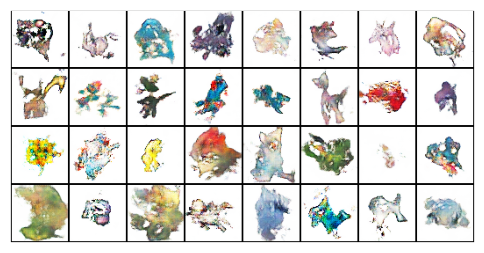

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [33/100], loss_crit: -12.1231, loss_gen: 17.5383


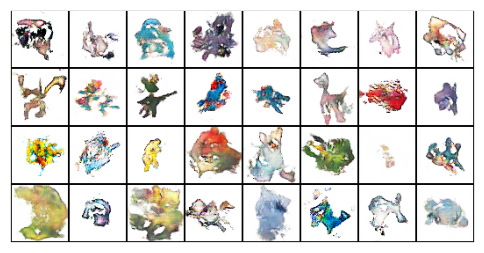

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [34/100], loss_crit: -12.3047, loss_gen: 17.9535


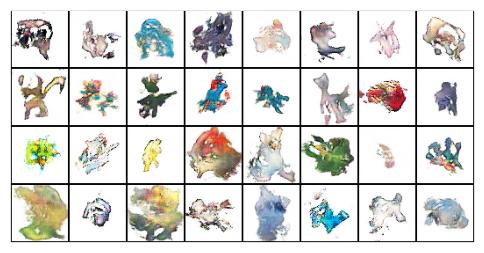

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [35/100], loss_crit: -12.1234, loss_gen: 18.0707


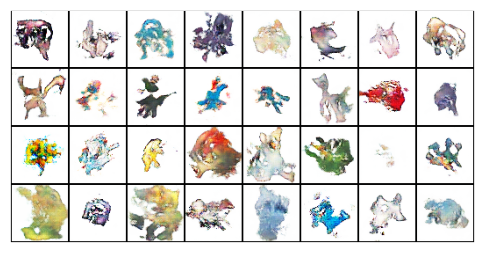

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [36/100], loss_crit: -12.2688, loss_gen: 19.1788


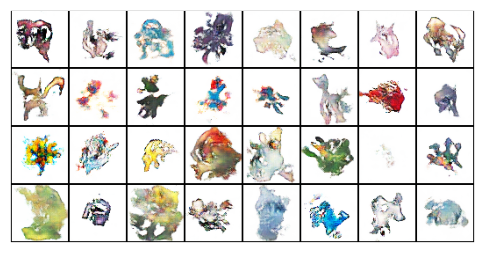

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [37/100], loss_crit: -12.2511, loss_gen: 18.7298


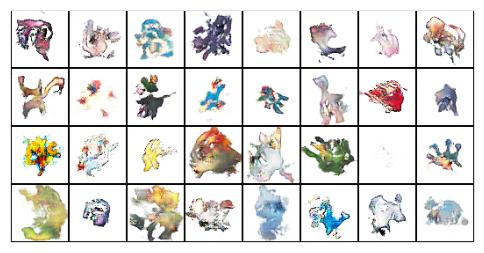

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [38/100], loss_crit: -12.5121, loss_gen: 19.0998


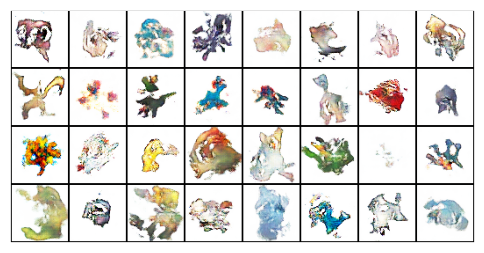

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [39/100], loss_crit: -12.3476, loss_gen: 20.4423


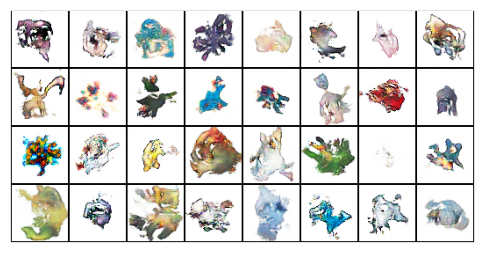

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [40/100], loss_crit: -12.4324, loss_gen: 21.3562


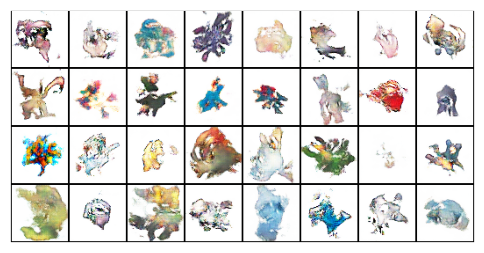

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [41/100], loss_crit: -12.7719, loss_gen: 21.8476


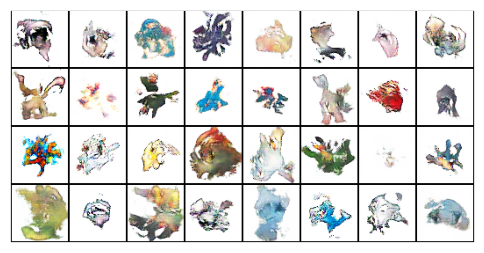

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [42/100], loss_crit: -12.7966, loss_gen: 23.0564


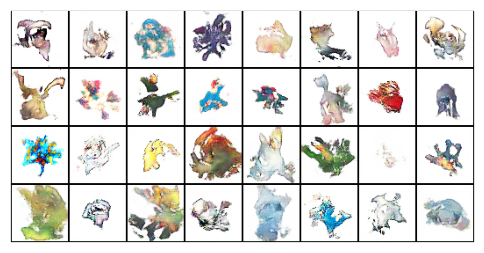

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [43/100], loss_crit: -12.8342, loss_gen: 24.1875


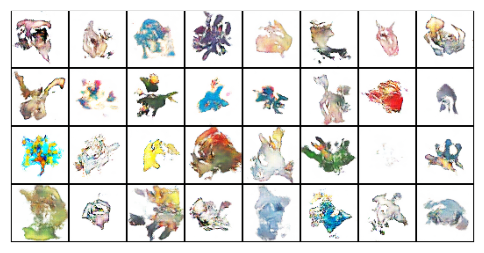

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [44/100], loss_crit: -12.7335, loss_gen: 24.2489


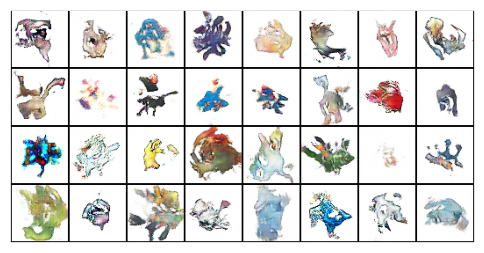

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [45/100], loss_crit: -12.9099, loss_gen: 24.8619


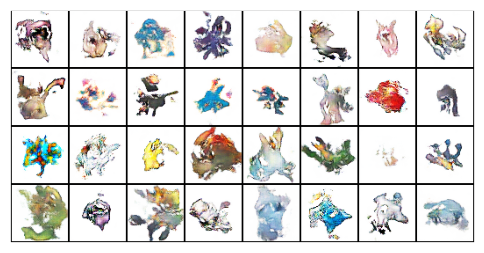

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [46/100], loss_crit: -12.8619, loss_gen: 26.0471


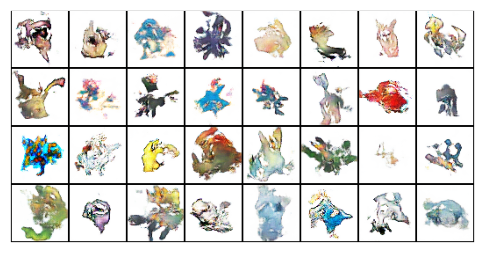

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [47/100], loss_crit: -12.9679, loss_gen: 27.3958


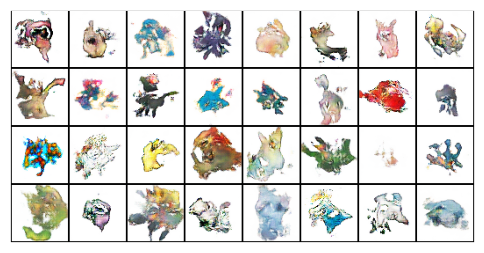

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [48/100], loss_crit: -13.0391, loss_gen: 28.4281


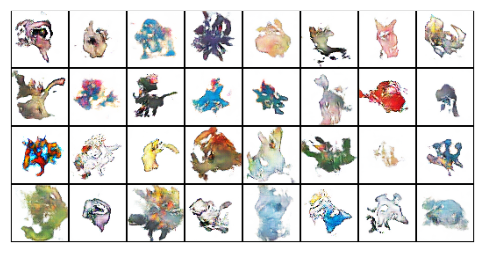

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [49/100], loss_crit: -13.1942, loss_gen: 28.1359


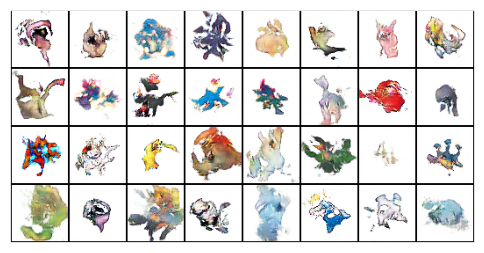

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [50/100], loss_crit: -13.2337, loss_gen: 30.2568


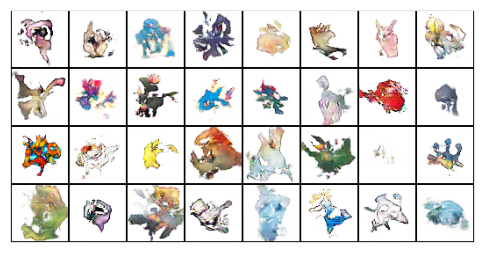

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [51/100], loss_crit: -13.1907, loss_gen: 31.3092


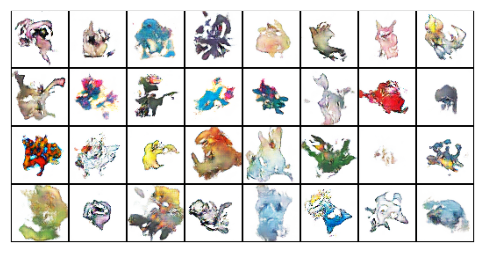

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [52/100], loss_crit: -13.4023, loss_gen: 32.9867


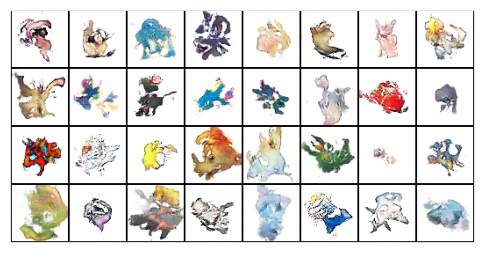

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [53/100], loss_crit: -13.4322, loss_gen: 33.9563


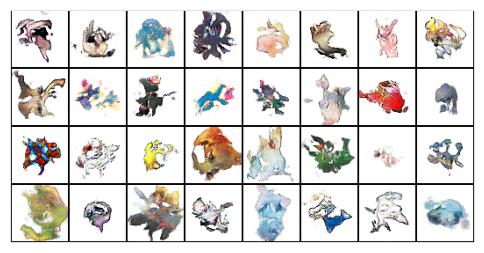

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [54/100], loss_crit: -13.5023, loss_gen: 34.5072


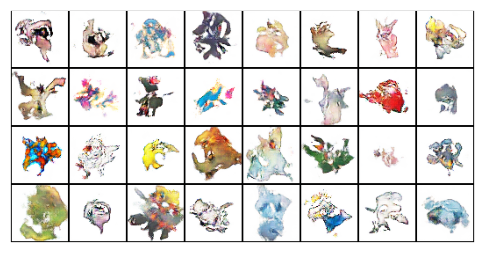

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [55/100], loss_crit: -13.4610, loss_gen: 35.0438


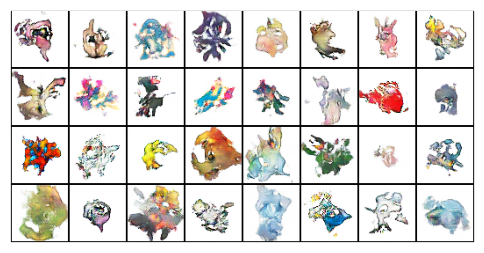

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [56/100], loss_crit: -13.6233, loss_gen: 35.6466


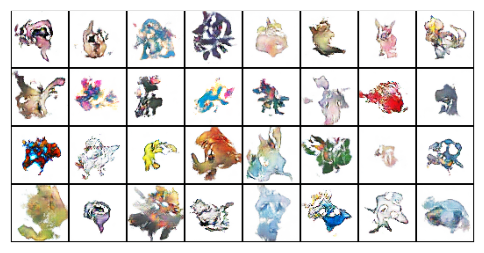

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [57/100], loss_crit: -13.6594, loss_gen: 39.4268


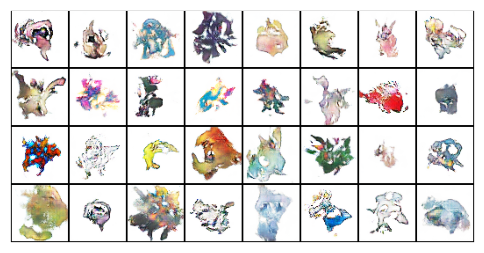

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [58/100], loss_crit: -13.8601, loss_gen: 39.0296


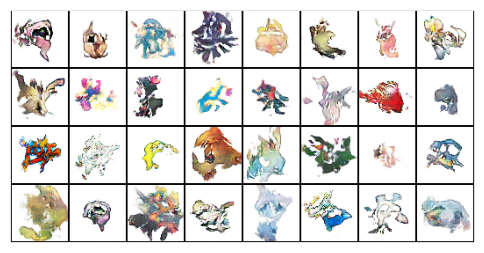

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [59/100], loss_crit: -13.8506, loss_gen: 39.1188


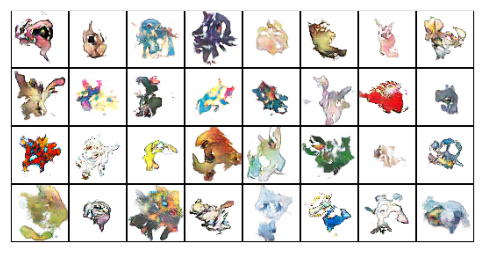

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [60/100], loss_crit: -13.8824, loss_gen: 40.0302


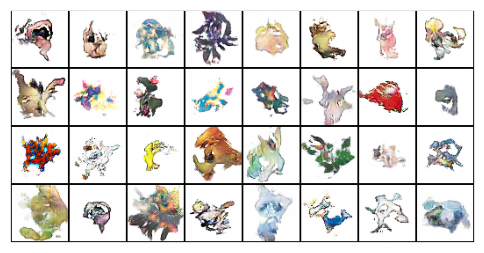

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [61/100], loss_crit: -13.9168, loss_gen: 41.3071


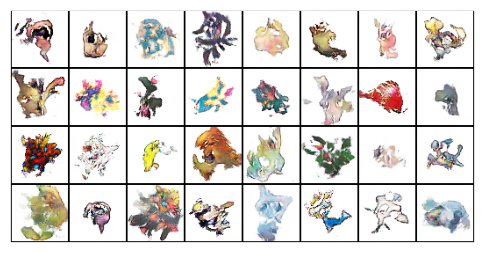

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [62/100], loss_crit: -14.0601, loss_gen: 43.1541


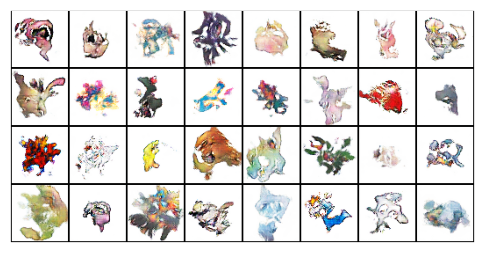

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [63/100], loss_crit: -13.9088, loss_gen: 43.8173


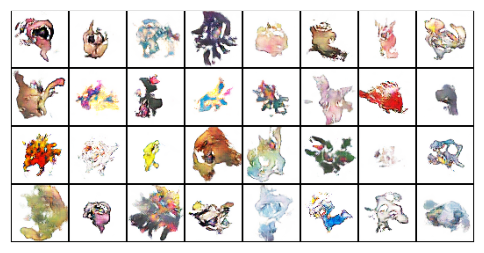

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [64/100], loss_crit: -13.9617, loss_gen: 45.0739


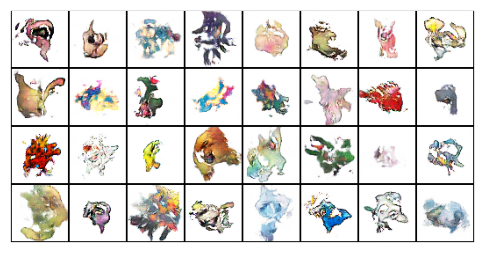

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [65/100], loss_crit: -14.0016, loss_gen: 47.3973


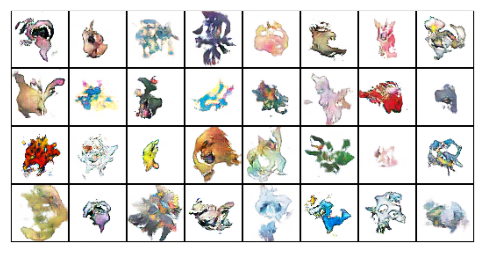

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [66/100], loss_crit: -14.4552, loss_gen: 48.3240


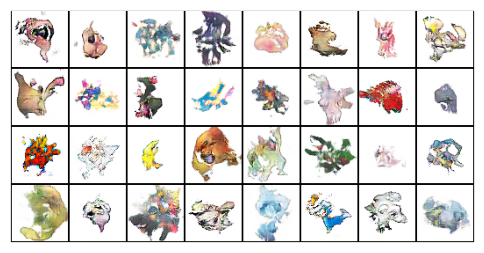

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [67/100], loss_crit: -14.2526, loss_gen: 50.3689


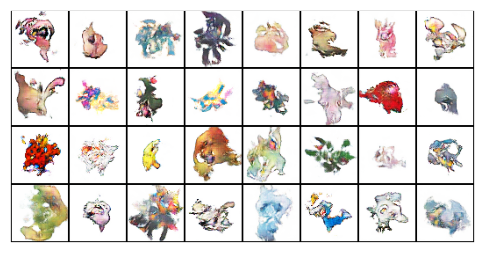

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [68/100], loss_crit: -14.1346, loss_gen: 51.9767


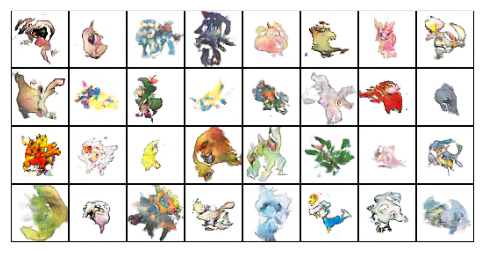

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [69/100], loss_crit: -14.3730, loss_gen: 50.8039


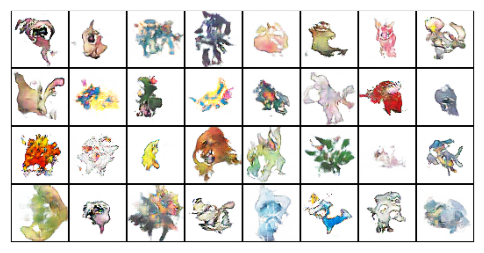

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [70/100], loss_crit: -14.4319, loss_gen: 51.4340


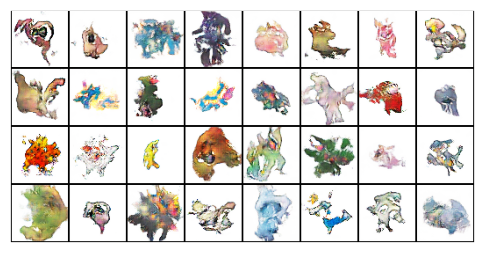

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [71/100], loss_crit: -14.6764, loss_gen: 53.0842


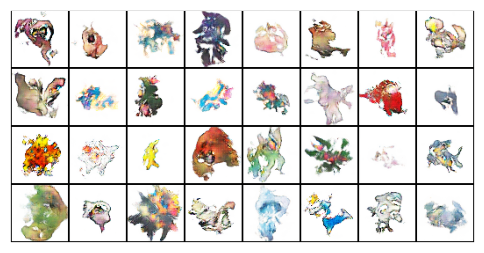

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [72/100], loss_crit: -14.4808, loss_gen: 55.0878


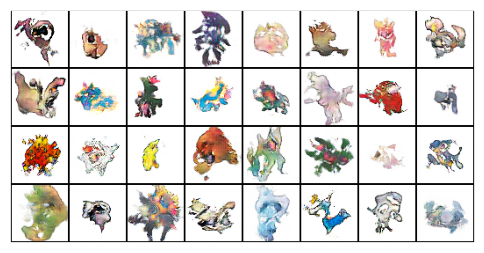

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [73/100], loss_crit: -14.5239, loss_gen: 56.4410


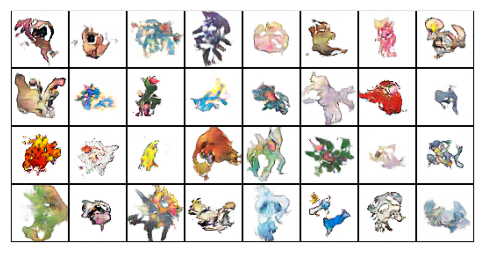

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [74/100], loss_crit: -14.5141, loss_gen: 56.1542


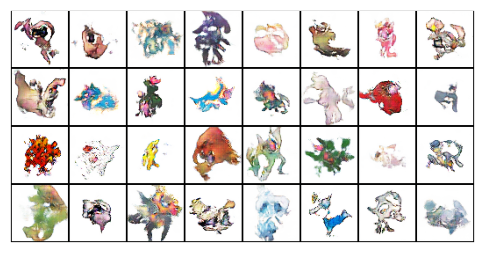

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [75/100], loss_crit: -14.4254, loss_gen: 59.4866


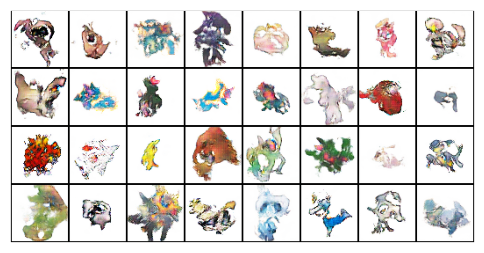

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [76/100], loss_crit: -14.7227, loss_gen: 60.4866


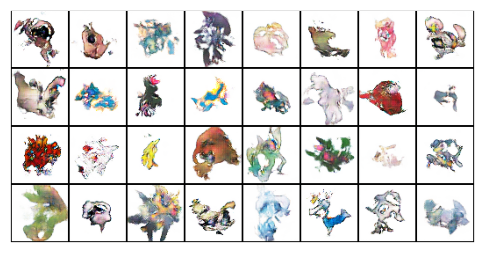

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [77/100], loss_crit: -14.5452, loss_gen: 61.1709


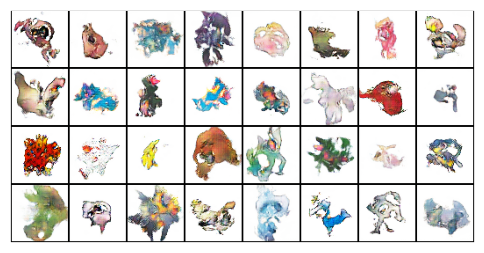

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [78/100], loss_crit: -14.6071, loss_gen: 62.7973


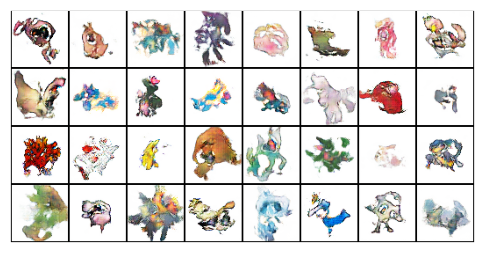

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [79/100], loss_crit: -14.6847, loss_gen: 62.6071


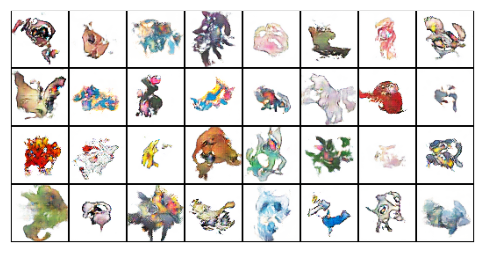

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [80/100], loss_crit: -14.6948, loss_gen: 64.4352


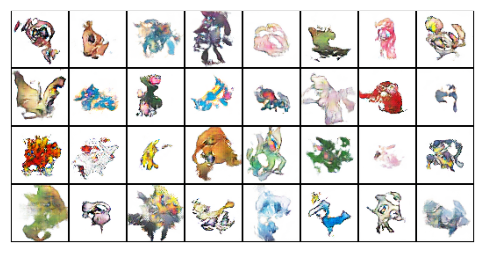

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [81/100], loss_crit: -14.4205, loss_gen: 66.3033


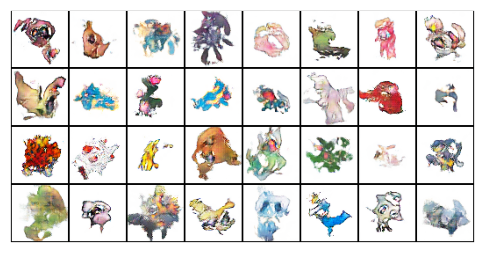

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [82/100], loss_crit: -14.6525, loss_gen: 65.7978


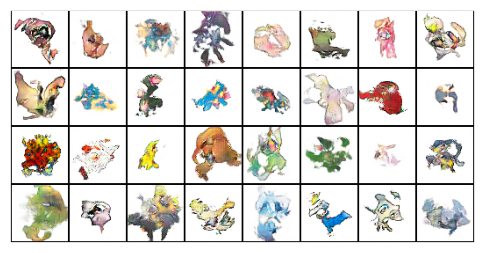

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [83/100], loss_crit: -14.5851, loss_gen: 67.7095


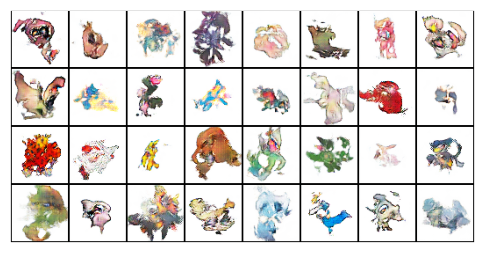

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [84/100], loss_crit: -14.8302, loss_gen: 68.4938


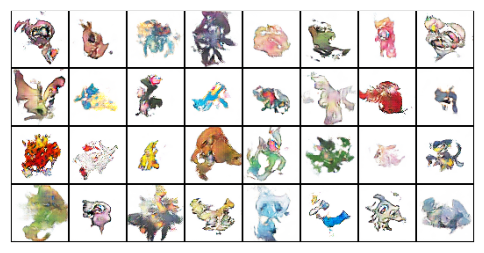

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [85/100], loss_crit: -14.6473, loss_gen: 68.9635


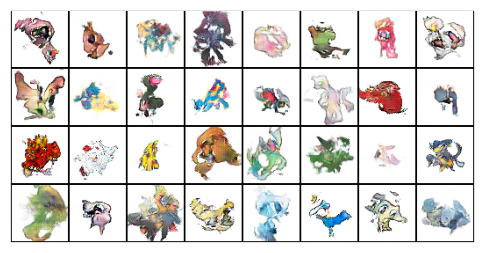

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [86/100], loss_crit: -14.9864, loss_gen: 70.9169


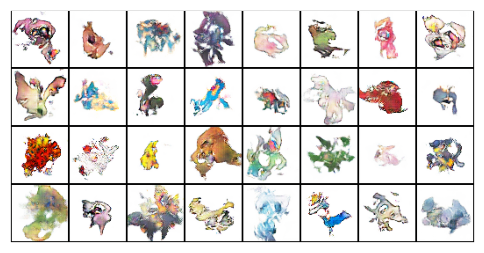

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [87/100], loss_crit: -14.9048, loss_gen: 71.6558


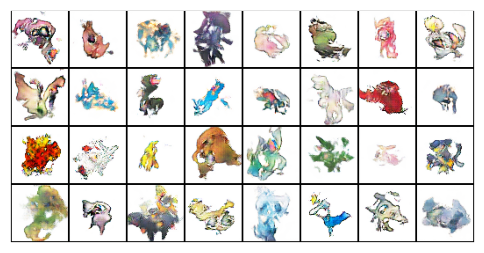

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [88/100], loss_crit: -14.8125, loss_gen: 73.0067


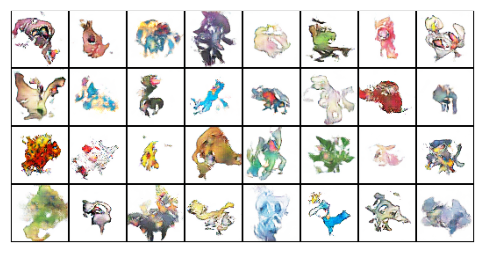

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [89/100], loss_crit: -15.0159, loss_gen: 75.3421


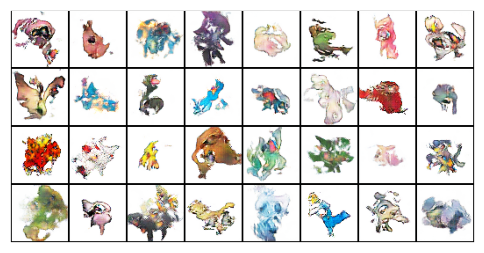

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [90/100], loss_crit: -14.8346, loss_gen: 78.3008


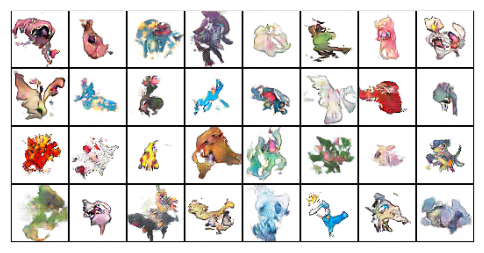

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [91/100], loss_crit: -14.9783, loss_gen: 77.2522


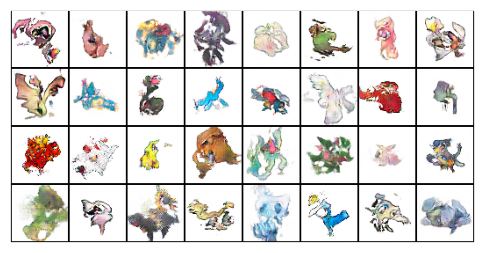

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [92/100], loss_crit: -14.9401, loss_gen: 78.1924


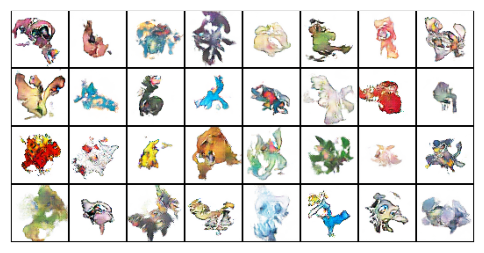

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [93/100], loss_crit: -15.1562, loss_gen: 77.7659


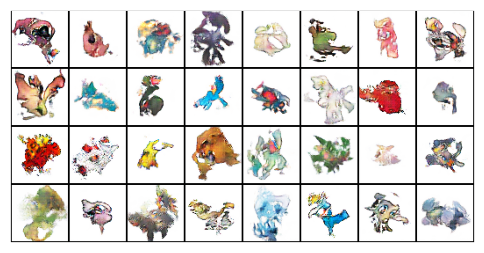

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [94/100], loss_crit: -15.0764, loss_gen: 81.3734


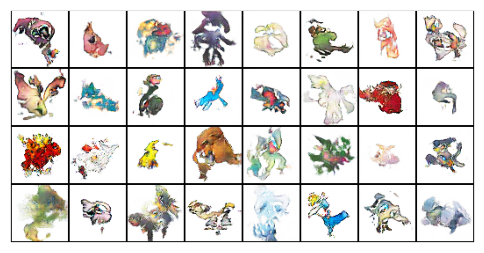

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [95/100], loss_crit: -14.8710, loss_gen: 81.3475


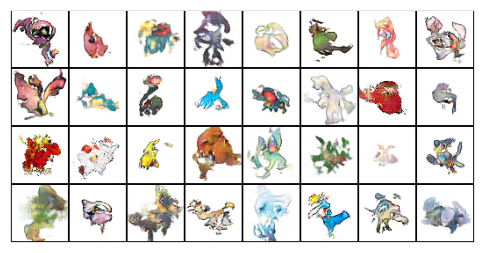

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [96/100], loss_crit: -15.1563, loss_gen: 82.7074


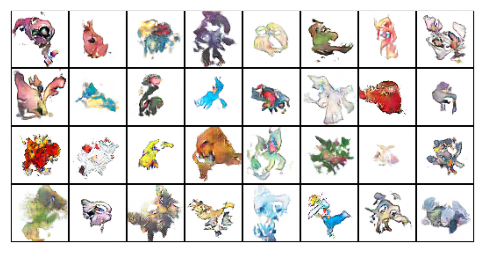

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [97/100], loss_crit: -15.0285, loss_gen: 83.9980


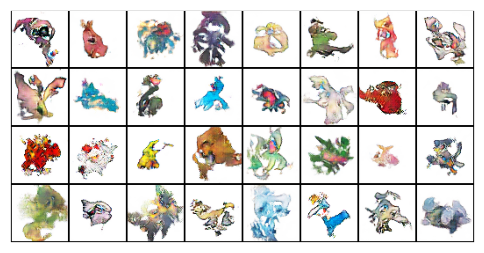

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [98/100], loss_crit: -15.1265, loss_gen: 85.3879


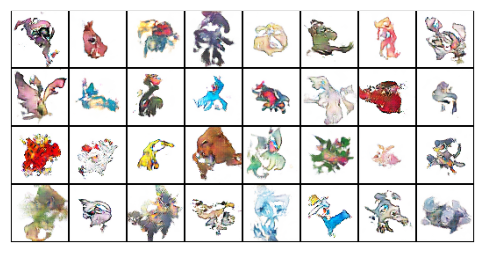

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [99/100], loss_crit: -15.0947, loss_gen: 86.7146


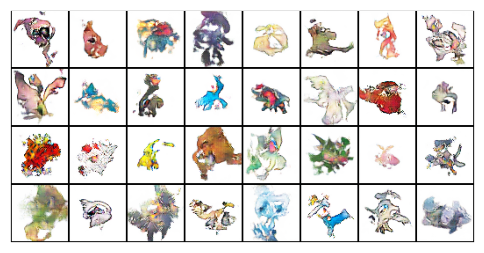

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch [100/100], loss_crit: -15.2196, loss_gen: 87.6383


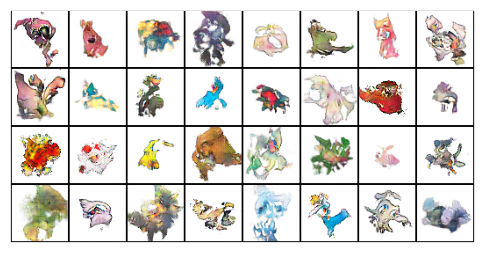

In [15]:
# Training loop
for epoch in range(NUM_EPOCHS):
    losses_critic_per_epoch = []
    losses_generator_per_epoch = []
    for real_images, _ in tqdm(dloader):
        real_images = real_images.to(device)

        # train critic: min -(E[critic(real)] - E[critic(generator(noise))]) + lambda * (||grad D|| - 1) ^ 2
        for _ in range(CRITIC_ITERATIONS):
            latent_noise = torch.randn(real_images.shape[0], Z_DIM, 1, 1).to(device)
            fake_images = generator(latent_noise)
            critic_real_out = critic(real_images)
            critic_fake_out = critic(fake_images)
            gp = gradient_penalty(critic, real_images, fake_images, device=device)
            loss_critic = -(torch.mean(critic_real_out) - torch.mean(critic_fake_out)) + LAMBDA_GP * gp
            critic.zero_grad()
            loss_critic.backward(retain_graph=True)
            opt_critic.step()

        # train generator: min -E[critic(fake)]
        critic_fake_out2 = critic(fake_images).reshape(-1)
        loss_generator = - torch.mean(critic_fake_out2)
        generator.zero_grad()
        loss_generator.backward()
        opt_generator.step()
        
        losses_critic_per_epoch.append(loss_critic.item())
        losses_generator_per_epoch.append(loss_generator.item())
    # Record losses 
    losses_critic.append(np.mean(losses_critic_per_epoch))
    losses_generator.append(np.mean(losses_generator_per_epoch))
    
    # Print losses
    print("Epoch [{}/{}], loss_crit: {:.4f}, loss_gen: {:.4f}".format(
            epoch+1, NUM_EPOCHS, 
            losses_critic[-1], losses_generator[-1]))
    
    # Save model states
    if epoch % 5 == 0:
        torch.save(generator.state_dict(), f'model_{epoch}.pth')

    # Print generated images from the fixed z
    with torch.no_grad():
        showed_images = generator(fixed_z).cpu()
        fig, ax = plt.subplots(figsize=(6, 6))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(denorm(showed_images.detach()[:32]), nrow=8).permute(1, 2, 0))
        plt.show()

In [16]:
torch.save(generator.state_dict(), 'model.pth')

In [60]:
def save_samples(index, gen_model, latent_tensors, show=True):
    fake_images = gen_model(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(12, 12))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [61]:
generator_tuned = Generator(Z_DIM, CHANNELS_IMG, GEN_CHANNELS).to(device)

In [62]:
generator_tuned.load_state_dict(torch.load('model.pth', map_location=torch.device('cpu')))

<All keys matched successfully>

In [63]:
noise = torch.randn(64, Z_DIM, 1, 1).to(device)

In [64]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [65]:
save_samples(100, generator_tuned, noise, show=False)

Saving generated-images-0100.png
